# Homework 3 of "Fundamentals of 3D Computer Vision"
<div style="text-align: center">
<h1 style = "color: red"> Sharif University Of Technology</h1>
<h2 style = "color: green"> Professor Shohreh Kasaei </h2>
<h3 style = "color: cyan"> Related TA: AmirHossein Razlighi <h3>
<h4 style = "color: white"> Ask your questions via quera or <a href="mailto:arazlighi@gmail.com">email</a></h4>
<h5> Save your file with format: STUDENT NUMBER_HW3.ipynb or .zip </h5>
</div>

In [1]:
student_number = "400104867"
name ="Payam Taebi"

## Question 1: Understanding Rotations in-depth! [45 points]

In this question, we want to visualize some rotations in 3D Space. we will get to understand what are quaternions, and rotation matrices. We will also see how to convert between these representations.

### Quaternions
We know that going from _Real Numbers_ which are 1 dimensional to _Complex Numbers_, we add an axis such that:
$$
Complex\_Number = a + bi
$$
$$
a , b \in \mathbb{R}
$$

Now, what are quaternions? Let's add an axis to the complex numbers! That is quite abstract such that we can not even imagine what it means, right? But it turns out to be a powerful mathematical approach for representing rotations! Let's see how we can represent quaternions:

$$
Quaternion = a + bi + cj + dk
$$
$$
a , b , c , d \in \mathbb{R}
$$

where $i , j , k$ are the imaginary units.

<div style = "text-align:center"><img src="./Images/axis-angle.png" /></div>

As you can see, these abstract terms actually mean something! The first parameter (namely, $a$ in our example) is the angle of rotation and the rest, show the vector of rotation. So, we can represent a rotation in 3D space with a quaternion. But how can we convert between quaternions and rotation matrices? Let's see!

In [2]:
%pip install numpy matplotlib plotly nbformat scipy

**Note**: You **CAN *NOT*** use ready to use Rotation functions such as `scipy.spatial.transforms` or `cv2`. You should implement the functions yourself. The imported `scipy` library is used in another cases further (and to test your code).

[35 points]

In [3]:
import numpy as np
import plotly.graph_objs as go
from plotly.subplots import make_subplots

class Rotation:
    def __init__(self, matrix=None):
        if matrix is None:
            self.matrix = np.identity(3)
        else:
            self.matrix = matrix

    def from_quat(self, w, x, y, z):
        norm = np.sqrt(w**2 + x**2 + y**2 + z**2)
        w, x, y, z = w/norm, x/norm, y/norm, z/norm

        wx, wy, wz = w * x, w * y, w * z
        xx, xy, xz = x * x, x * y, x * z
        yy, yz, zz = y * y, y * z, z * z

        rotation_matrix = np.array([[1 - 2 * (yy + zz), 2 * (xy - wz), 2 * (xz + wy)],
                                    [2 * (xy + wz), 1 - 2 * (xx + zz), 2 * (yz - wx)],
                                    [2 * (xz - wy), 2 * (yz + wx), 1 - 2 * (xx + yy)]])
        
        self.matrix = rotation_matrix
        return self

    def from_matrix(self, matrix):
        self.matrix = matrix
        return self

    def as_matrix(self):
        return self.matrix

    def as_quat(self):
        trace = np.trace(self.matrix)
        if trace > 0:
            s = 0.5 / np.sqrt(trace + 1.0)
            w = 0.25 / s
            x = (self.matrix[2, 1] - self.matrix[1, 2]) * s
            y = (self.matrix[0, 2] - self.matrix[2, 0]) * s
            z = (self.matrix[1, 0] - self.matrix[0, 1]) * s
        else:
            if self.matrix[0, 0] > self.matrix[1, 1] and self.matrix[0, 0] > self.matrix[2, 2]:
                s = 2.0 * np.sqrt(1.0 + self.matrix[0, 0] - self.matrix[1, 1] - self.matrix[2, 2])
                w = (self.matrix[2, 1] - self.matrix[1, 2]) / s
                x = 0.25 * s
                y = (self.matrix[0, 1] + self.matrix[1, 0]) / s
                z = (self.matrix[0, 2] + self.matrix[2, 0]) / s
            elif self.matrix[1, 1] > self.matrix[2, 2]:
                s = 2.0 * np.sqrt(1.0 + self.matrix[1, 1] - self.matrix[0, 0] - self.matrix[2, 2])
                w = (self.matrix[0, 2] - self.matrix[2, 0]) / s
                x = (self.matrix[0, 1] + self.matrix[1, 0]) / s
                y = 0.25 * s
                z = (self.matrix[1, 2] + self.matrix[2, 1]) / s
            else:
                s = 2.0 * np.sqrt(1.0 + self.matrix[2, 2] - self.matrix[0, 0] - self.matrix[1, 1])
                w = (self.matrix[1, 0] - self.matrix[0, 1]) / s
                x = (self.matrix[0, 2] + self.matrix[2, 0]) / s
                y = (self.matrix[1, 2] + self.matrix[2, 1]) / s
                z = 0.25 * s

        return w, x, y, z

    def apply(self, vector):
        return np.dot(self.matrix, vector)


## Visualizing a Quaternion [10 points]

Here, we want to rotate a sample vector in 3D space w.r.t a quaternion. You can use the `Rotation` class that you defined above. Visualze the original vector, the rotation vector (which is shown by x, y and z components of quaternion) and the final rotated vector.

In [4]:
original_vector = np.array([3, 5, 7])
original_vector = original_vector / np.linalg.norm(original_vector)

rotation_quaternion = np.array([0.25, 0.5, 0.15, 0.05])

rotation_object = Rotation().from_quat(*rotation_quaternion)
rotation_matrix = rotation_object.as_matrix()

# Rotate the vector using the quaternion
rotated_vector = rotation_object.apply(original_vector)

# Get the rotation axis quaternion
rotation_axis_quat = Rotation().from_matrix(rotation_matrix).as_quat()

# Plotting
fig = go.Figure()

# Original vector
fig.add_trace(
    go.Scatter3d(x=[0, original_vector[0]], y=[0, original_vector[1]], z=[0, original_vector[2]], mode='lines+markers', name='Original')
)

# Rotation axis
fig.add_trace(
    go.Scatter3d(x=[0, rotation_axis_quat[1]], y=[0, rotation_axis_quat[2]], z=[0, rotation_axis_quat[3]], mode='lines+markers', name='Rotation Axis')
)

# Rotated vector
fig.add_trace(
    go.Scatter3d(x=[0, rotated_vector[0]], y=[0, rotated_vector[1]], z=[0, rotated_vector[2]], mode='lines+markers', name='Rotated')
)

fig.update_layout(scene=dict(aspectmode='data'))
fig.show()


### Testing your implementations 
(Your implementations should pass the tests below. **Don't** change the codes in these cells. Just run them!)

In [5]:
from scipy.spatial.transform import Rotation as R

# Testing your code (Do not change this part of the code)
for i in range(5):
    original_vector = np.random.rand(3)
    original_vector = original_vector / np.linalg.norm(original_vector)
    rotation_quaternion = np.random.rand(4)
    rotation_quaternion = rotation_quaternion / np.linalg.norm(rotation_quaternion)
    rotation_object = Rotation().from_quat(*rotation_quaternion)
    rotation_matrix = rotation_object.as_matrix()
    rotated_vector = rotation_object.apply(original_vector)
    assert np.allclose(
        rotation_matrix,
        R.from_quat(rotation_quaternion[[1, 2, 3, 0]]).as_matrix(),
        atol=1e-6,
        rtol=1e-6,
    )

    assert np.allclose(
        rotated_vector,
        R.from_quat(rotation_quaternion[[1, 2, 3, 0]]).apply(original_vector),
        atol=1e-6,
        rtol=1e-6,
    )

In [6]:
# Testing your code (Do not change this part of the code)
for i in range(5):
    original_vector = np.random.rand(3)
    original_vector = original_vector / np.linalg.norm(original_vector)
    rotation_matrix = R.random().as_matrix()
    rotation_object = Rotation().from_matrix(rotation_matrix)
    rotation_quaternion = rotation_object.as_quat()
    rotated_vector = rotation_object.apply(original_vector)
    
    assert np.allclose(
        rotation_quaternion,
        R.from_matrix(rotation_matrix).as_quat()[[3, 0, 1, 2]],
        atol=1e-6,
        rtol=1e-6,
    ) or np.allclose(
        rotation_quaternion,
        -R.from_matrix(rotation_matrix).as_quat()[[3, 0, 1, 2]],
        atol=1e-6,
        rtol=1e-6,
    )

    assert np.allclose(
        rotated_vector,
        R.from_matrix(rotation_matrix).apply(original_vector),
        atol=1e-6,
        rtol=1e-6,
    )

# Question 2: Estimating Camera Pose from 2D-3D correspondences [55 points]

In this question, you are given a set of 2D-3D correspondences. You are also given the intrinsic parameters of the camera. You need to estimate the pose of the camera (R & T) in the world coordinate system. Let's start!

- Step1: Creating the dataset (Corresponding 3d-2d points):
  
  Just run the cell below without changing it!

In [21]:
from scipy.spatial.transform import Rotation as R
import numpy as np

rot = R.random().as_matrix()
trans = np.array([5, 10, 15])

_3d_points = np.random.rand(100, 3)
_3d_points = _3d_points - np.mean(_3d_points, axis=0)
_3d_points_normalized = _3d_points / np.linalg.norm(_3d_points, axis=1)[:, None]


_2d_points = []
for i in range(100):
    _2d_points.append(rot @ _3d_points_normalized[i] + trans)

_2d_points = np.array(_2d_points)
_2d_points[:, :] /= _2d_points[:, 2][:, None]

In [22]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=2, specs=[[{'type': 'scatter3d'}, {'type': 'scatter'}]])

# Plot 3D points
fig.add_trace(
    go.Scatter3d(
        x=_3d_points[:, 0],
        y=_3d_points[:, 1],
        z=_3d_points[:, 2],
        mode='markers',
        marker=dict(size=5, color='blue'),
        name='3D Points'
    ),
    row=1, col=1
)

# Plot 2D points
fig.add_trace(
    go.Scatter(
        x=_2d_points[:, 0],
        y=_2d_points[:, 1],
        mode='markers',
        marker=dict(size=5, color='red'),
        name='2D Projected Points'
    ),
    row=1, col=2
)

# Set layout
fig.update_layout(scene=dict(aspectmode="data"))
fig.update_layout(title='3D Points and 2D Projected Points')


fig.show()

# Combine 3D and 2D points in one trace
combined_points = np.vstack((_3d_points, _2d_points))

# Create a color array to distinguish 3D and 2D points
colors = ['blue'] * 100 + ['red'] * 100

# Visualize 3D and 2D points connected by lines
fig = make_subplots(rows=1, cols=1, specs=[[{'type': 'scatter3d'}]])

fig.add_trace(
    go.Scatter3d(
        x=combined_points[:, 0],
        y=combined_points[:, 1],
        z=combined_points[:, 2],
        mode='markers',
        marker=dict(size=5, color=colors),
        name='Combined 3D and 2D Points'
    )
)

# Set layout
fig.update_layout(scene=dict(aspectmode="data"))
fig.update_layout(title='Combined 3D and 2D Points with Lines')

# Show the plot
fig.show()



[10 points]

### Estimate the Pose matrix(H) using LSE method and the given dataset:

We know that for converting a 3D point to a 2D point, we can use the following equation:
$$
\lambda x = K (RX + T)
$$

Here, for the sake of simplicity, consider $K=I$ and $\lambda = 1$. So, we have:
$$
x = RX + T
$$

We can stack $R \& T$ together in an $H$ matrix (you may seen this as $g$ in the course's slides) and write this as:
$$
x = HX
$$

**Here, the task is simply estimating the matrix $H$, given the data correspondences we had earlier. Use LSE to estimate the matrix H and then print it out. You can use Regularization term and any desired number of iterations to reach your desired accuracy.**

[35 points]

first i implement normal LSE


In [23]:
import numpy as np
from scipy.optimize import minimize

def cost_function(H_flat, x, X):
    H_matrix = H_flat.reshape(3, 4)
    
    # Convert 3D points to homogeneous coordinates
    X_homogeneous = np.hstack((X, np.ones((X.shape[0], 1))))
    
    # Project 3D points to 2D using H matrix
    projected_points = np.dot(H_matrix, X_homogeneous.T).T

    # Normalize homogeneous coordinates
    projected_points_normalized = projected_points[:, :2] / projected_points[:, 2][:, None]

    # Calculate the difference between observed and projected 2D points
    error = np.sum((x - projected_points_normalized) ** 2)

    return error

# Given 2D and 3D points
x_points = _2d_points[:, :2]  # Extract the first two columns for x and y
X_points = _3d_points_normalized

# Initial guess for H matrix
initial_H = np.eye(3, 4).flatten()

# Use scipy's minimize function to find the optimal H matrix
result = minimize(cost_function, initial_H, args=(x_points, X_points), method='L-BFGS-B')

# Reshape the result to obtain the estimated H matrix
estimated_H = result.x.reshape(3, 4)

# Print the estimated H matrix
print("Estimated H matrix:")
print(estimated_H)

# Calculate the error after optimization
final_error = cost_function(result.x, x_points, X_points)
print("\nFinal Error after Optimization:", final_error)


Estimated H matrix:
[[-0.19909544  0.05717164  0.92771738 -0.25782487]
 [-0.39490922  0.12530813  1.8273527  -0.49624523]
 [-0.59563679  0.18793481  2.73655917 -0.74331616]]

Final Error after Optimization: 0.3572132020653821


now i use pytorrch to get best H

In [24]:
import torch
from torch import nn
from torch.optim import LBFGS

# Convert numpy arrays to PyTorch tensors
x_points_torch = torch.tensor(x_points, dtype=torch.float32)
X_points_torch = torch.tensor(X_points, dtype=torch.float32)

# Define the model
class PoseEstimationModel(nn.Module):
    def __init__(self):
        super(PoseEstimationModel, self).__init__()
        self.H = nn.Parameter(torch.eye(3, 4).view(-1))

    def forward(self, X):
        H_matrix = self.H.view(3, 4)
        X_homogeneous = torch.cat([X, torch.ones(X.shape[0], 1)], dim=1)
        projected_points = torch.matmul(H_matrix, X_homogeneous.t()).t()
        projected_points_normalized = projected_points[:, :2] / projected_points[:, 2][:, None]
        return projected_points_normalized

# Initialize the model
model = PoseEstimationModel()

# Define the cost function
def cost_function(H_flat, x, X):
    model.H.data = H_flat
    projected_points = model(X)
    error = torch.sum((x - projected_points) ** 2)
    return error

# Initialize LBFGS optimizer
optimizer = LBFGS(model.parameters(), lr=0.8)

# Closure function for optimization
def closure():
    optimizer.zero_grad()
    loss = cost_function(model.H.data, x_points_torch, X_points_torch)
    loss.backward()
    return loss

# Run optimization
max_iter = 100  # You can adjust the number of iterations
for i in range(max_iter):
    optimizer.step(closure)

# Get the final estimated H matrix
final_H = model.H.data.view(3, 4).numpy()



# Print the estimated H matrix
print("Estimated H matrix using PyTorch:")
print(final_H)




Estimated H matrix using PyTorch:
[[-0.23267767  0.10645807  0.45174742 -0.26745105]
 [-0.46579367  0.21759821  0.89526606 -0.52537525]
 [-0.69944876  0.3204206   1.3355339  -0.78012043]]


[10 points]

In [25]:
# Calculate the error after optimization
final_error = cost_function(model.H.data, x_points_torch, X_points_torch).item()
# Print the final error
print("\nFinal Error after Optimization:", final_error)


Final Error after Optimization: 0.35134801268577576


now i plot the projected point

In [26]:
import numpy as np
import plotly.graph_objs as go

# Given final projective matrix H
H = final_H  # Replace with your actual projective matrix

# Assuming you already have 3D points (_3d_points) and their corresponding 2D points (_2d_points)

# Homogeneous coordinates for 3D points
_3d_points_homogeneous = np.hstack((_3d_points, np.ones((_3d_points.shape[0], 1))))

# Project 3D points to 2D using H
_2d_points_projected_homogeneous = np.dot(H, _3d_points_homogeneous.T).T

# Normalize the homogeneous coordinates
_2d_points_projected = _2d_points_projected_homogeneous[:, :2] / _2d_points_projected_homogeneous[:, 2][:, None]

# Create a Plotly scatter plot for real 2D points
real_trace = go.Scatter(
    x=_2d_points[:, 0],
    y=_2d_points[:, 1],
    mode='markers',
    name='Real 2D Points',
    marker=dict(color='blue')
)

# Create a Plotly scatter plot for projected 2D points
projected_trace = go.Scatter(
    x=_2d_points_projected[:, 0],
    y=_2d_points_projected[:, 1],
    mode='markers',
    marker=dict(color='red', symbol='x'),
    name='Projected Points'
)

# Create lines connecting each real point to its projected point
lines = []
for i in range(len(_2d_points)):
    color = f'rgba({i * 10 % 255}, {i * 20 % 255}, {i * 30 % 255}, 0.7)'
    lines.append(go.Scatter(
        x=[_2d_points[i, 0], _2d_points_projected[i, 0]],
        y=[_2d_points[i, 1], _2d_points_projected[i, 1]],
        mode='lines',
        line=dict(color=color, width=0.5),
        showlegend=False
    ))

# Create the layout
layout = go.Layout(
    title='Real vs Projected 2D Points',
    xaxis=dict(title='X'),
    yaxis=dict(title='Y'),
)

# Create the figure and add traces
fig = go.Figure(data=[real_trace, projected_trace] + lines, layout=layout)

# Show the figure
fig.show()


## Question 3: Image Mosaicing [**Extra** 30 points]

The task of image mosaicing is something we use everyday to create panoramas. In this question, we want to create a panorama from a set of images. We will use the homography matrix to do so. Let's start!

**NOTE**: You can use `cv2` library and its functions to do the task and there is no need to implement them from scratch.

In [13]:
%pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [14]:
import cv2
import matplotlib.pyplot as plt
import time
import numpy as np

Steps for image mosaicing:

1. Find KeyPoint in 2 images (frame n and frame n+1)
2. Match the keypoints to find the nearest neighbors of each pixel.
3. Estimate the Homography matrix using the matched keypoints.
4. Use the homography matrix to warp the images and create the panorama.

Let's start doing these steps!

### Find Keypoints in 2 images
Read the images from `./Images_Question3`. They are named `image1` to `image4`. Set the origin image to 1st image and the destination image to 2nd. We need to find important features in the images so we can understand the correspondence between them. How? Here we simply use `SIFT` algorithm to find the keypoints. You can use `cv2.SIFT_create()` to create a SIFT object and then use `sift.detectAndCompute()` to find the keypoints and descriptors. You can also use `cv2.drawKeypoints()` to draw the keypoints on the images.

### Match the keypoints to find nearest pixels
Now, we have 2 descriptors of the images, thanks to SIFT! These 2 are used to describe the image and everything in them. Now, we want to find the nearest neighbors of each pixel in origin to find out which pixel is the closest to it, in destination. Here again, you can use opencv functions for ease! Just use BruteForce matcher:
```python
bf = cv2.BFMatcher(cv2.NORM_L2)
matches = bf.knnMatch(des1, des2, k=2)
```
The `matches` object now contains the matches between these 2 images. you can access each item and it's info in matches. For example:
```
all_matches_idxs = [(m.trainIdx, m.queryIdx) for m, n in matches]
```

### Estimate Homography matrix

What is a homography matrix? You are familiar with _Homogeneous_ Matrices to represent pose of a camera. Now, suppose we see everything in our world as planar! So, we project every 3d point to a specific plane in the world, because in panorama images, we don't care about depth, do we?! Let's loook at the image below to understand it better:

<div style = "text-align:center"><img src="./Images/homography_transformation.jpg" /></div>

You can read more about it (and it's recommended!). But if you don't want to, it's allrigh! You just think of it as a **Transformation between points in image 1 and image 2**. In opencv, we do:
```
(H, status) = cv2.findHomography(pts1, pts2, cv2.RANSAC, reprojThreshold)
```


### Use the homography matrix to warp the images and create the panorama
Finally, simply we should bring the image2 corresponding points (in camera view 1) and then append them together in an image. So, We have $H$ which transforms points from view 1 to view 2 and vice verca. We simply use opencv to do the projection:

```
            result = cv2.warpPerspective(
                img1_orig,
                H,
                (img1_orig.shape[1] + img2_orig.shape[1], img1_orig.shape[0]),
            )
            result[0 : img2_orig.shape[0], 0 : img2_orig.shape[1]] = img2_orig
```


[You get all 30 extra points, if you implement **all of the parts** correctly and get the *correct results*!]

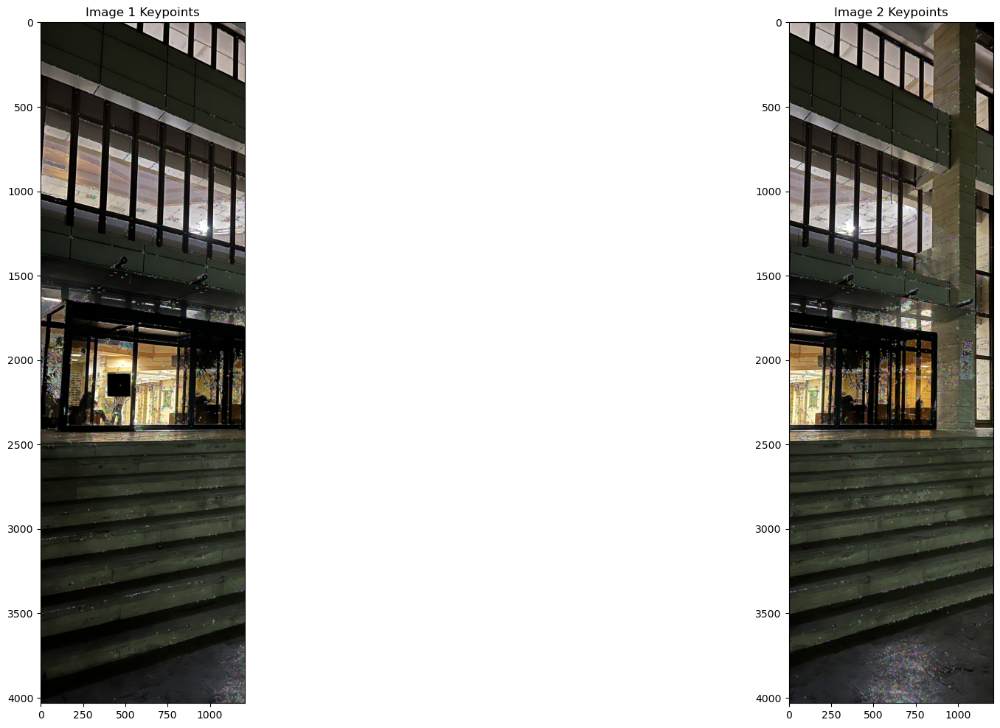

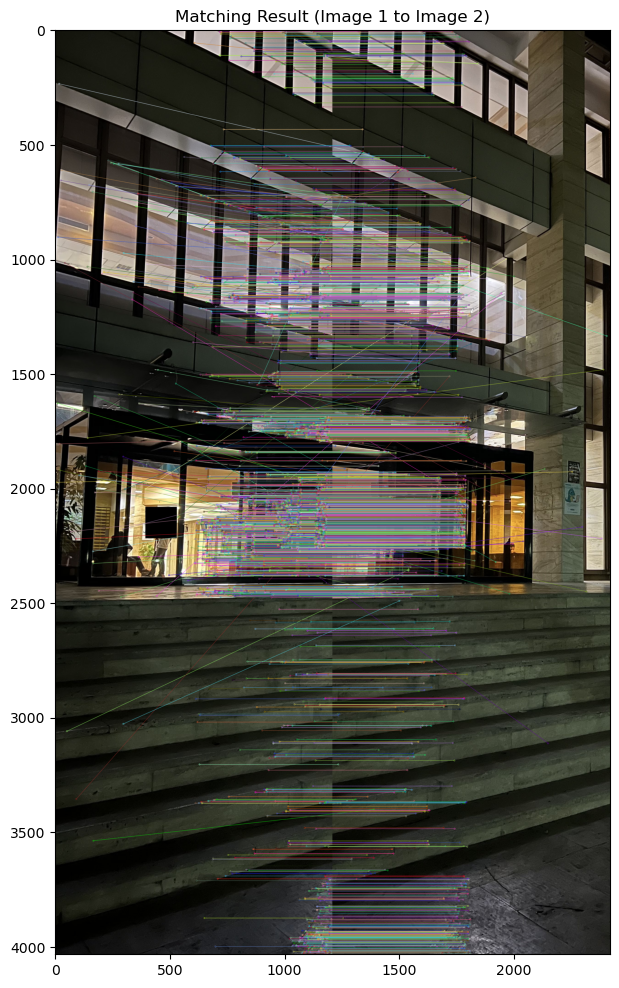

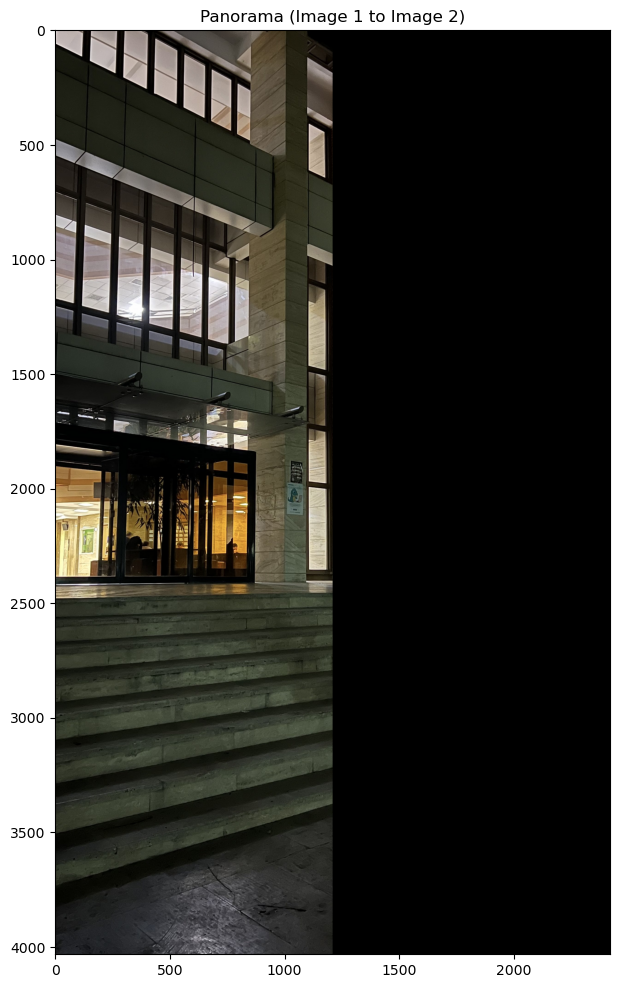

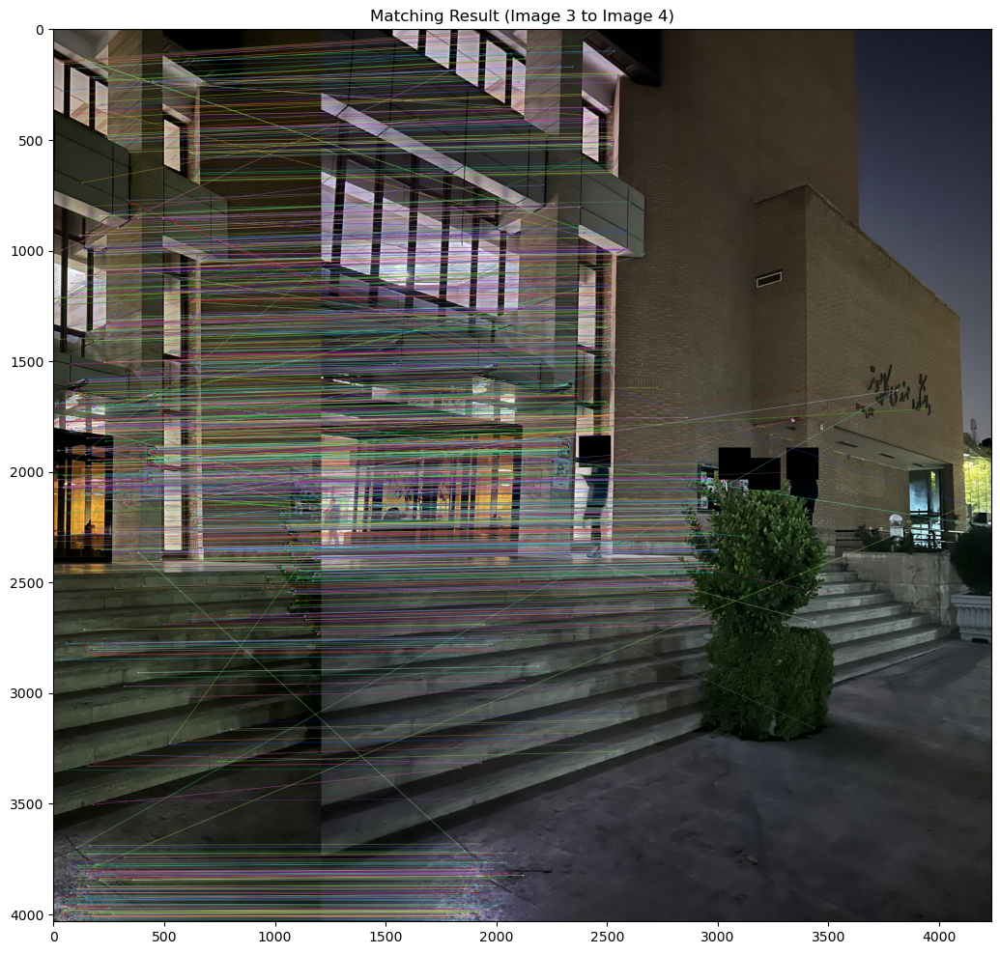

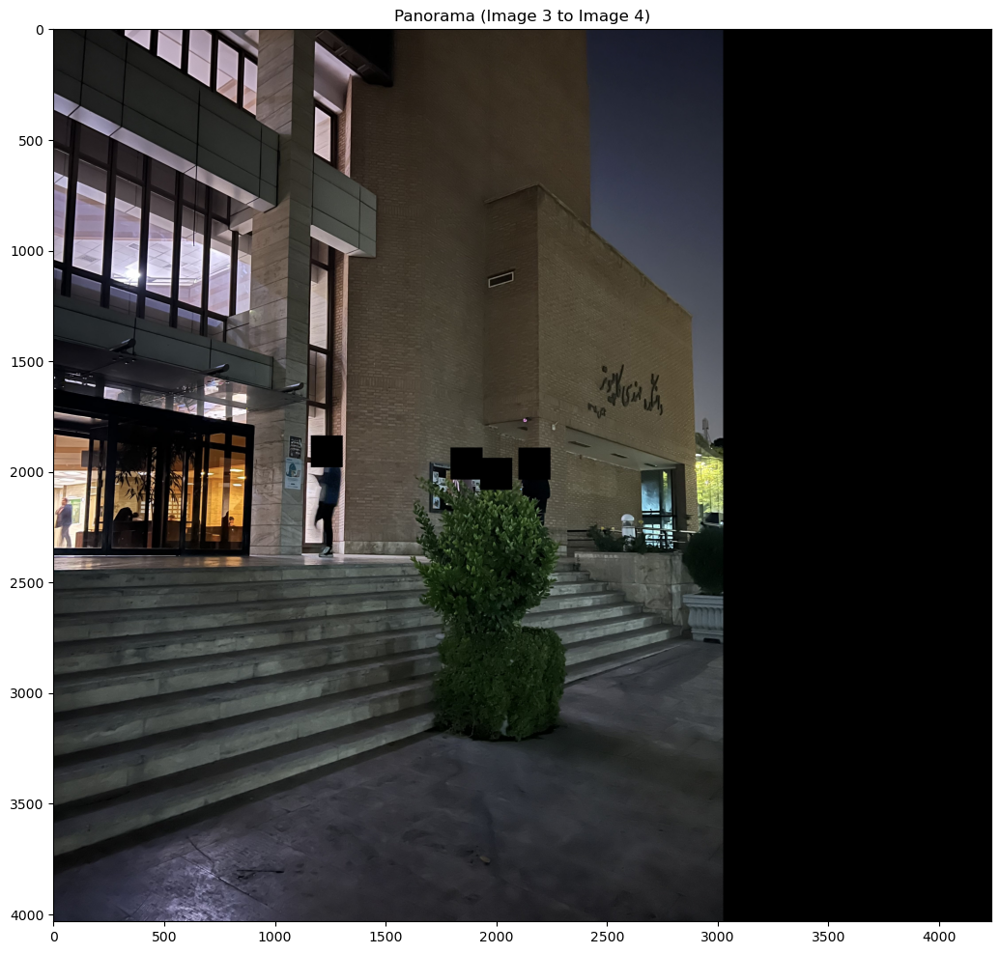

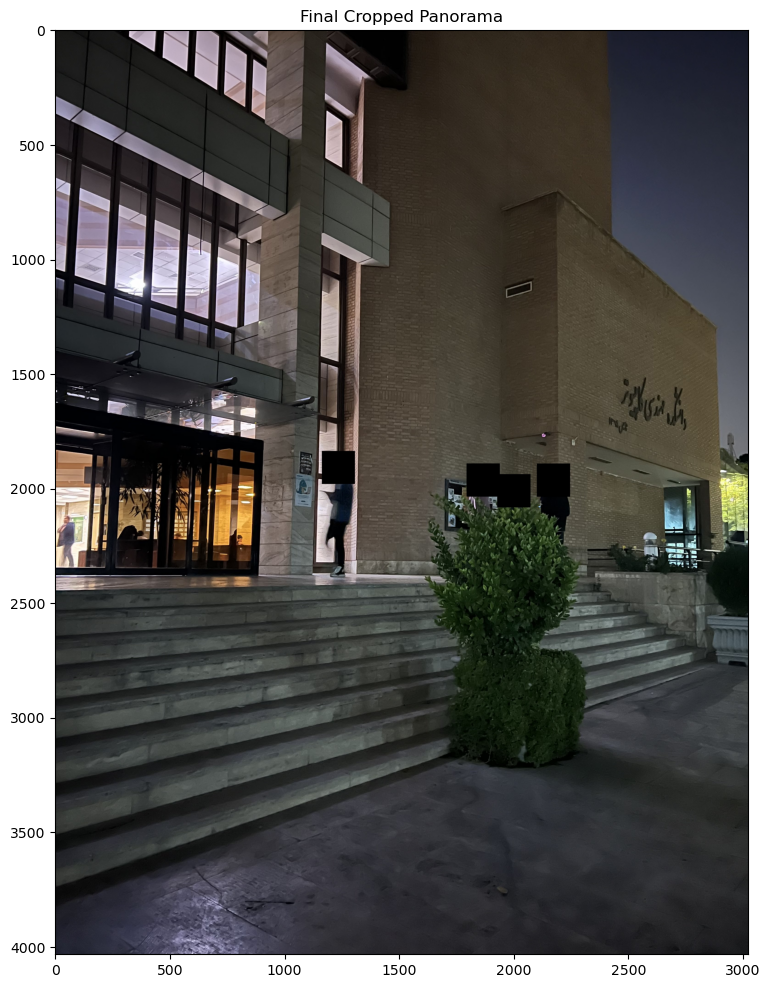

In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the images
img1 = cv2.imread('./Images_Question3/image1.jpg')
img2 = cv2.imread('./Images_Question3/image2.jpg')
img3 = cv2.imread('./Images_Question3/image3.jpg')
img4 = cv2.imread('./Images_Question3/image4.jpg')

# 1. Detect keypoints and compute descriptors for the first pair
sift = cv2.SIFT_create()
keypoints1, descriptors1 = sift.detectAndCompute(img1, None)
keypoints2, descriptors2 = sift.detectAndCompute(img2, None)

# Plot keypoints on images for the first pair
img1_keypoints = cv2.drawKeypoints(img1, keypoints1, None)
img2_keypoints = cv2.drawKeypoints(img2, keypoints2, None)

# Display images with keypoints for the first pair
plt.figure(figsize=(24, 12))
plt.subplot(121), plt.imshow(cv2.cvtColor(img1_keypoints, cv2.COLOR_BGR2RGB)), plt.title('Image 1 Keypoints')
plt.subplot(122), plt.imshow(cv2.cvtColor(img2_keypoints, cv2.COLOR_BGR2RGB)), plt.title('Image 2 Keypoints')
plt.show()

# 2. Match keypoints for the first pair
bf = cv2.BFMatcher()
matches = bf.knnMatch(descriptors1, descriptors2, k=2)

# Apply ratio test to get good matches for the first pair
good_matches = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good_matches.append(m)

# Draw matches on a new image for the first pair
matching_result = cv2.drawMatches(img1, keypoints1, img2, keypoints2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display the matching result for the first pair
plt.figure(figsize=(24, 12))
plt.imshow(cv2.cvtColor(matching_result, cv2.COLOR_BGR2RGB))
plt.title('Matching Result (Image 1 to Image 2)')
plt.show()

# 3. Calculate homographic matrix for the first pair
pts1 = np.float32([keypoints1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
pts2 = np.float32([keypoints2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

H1, _ = cv2.findHomography(pts1, pts2, cv2.RANSAC, 5.0)

# 4. Warp the image for the first pair
result1 = cv2.warpPerspective(img1, H1, (img1.shape[1] + img2.shape[1], img1.shape[0]))
result1[0:img2.shape[0], 0:img2.shape[1]] = img2

# Display the panorama for the first pair
plt.figure(figsize=(24, 12))
plt.imshow(cv2.cvtColor(result1, cv2.COLOR_BGR2RGB))
plt.title('Panorama (Image 1 to Image 2)')
plt.show()

# Repeat the process for the second pair (image3 to image4)

# 5. Stitch the two panoramas together
# Calculate keypoints and descriptors for the second pair
keypoints3, descriptors3 = sift.detectAndCompute(img3, None)
keypoints4, descriptors4 = sift.detectAndCompute(img4, None)

# Match keypoints for the second pair
matches2 = bf.knnMatch(descriptors3, descriptors4, k=2)

# Apply ratio test to get good matches for the second pair
good_matches2 = []
for m, n in matches2:
    if m.distance < 0.75 * n.distance:
        good_matches2.append(m)

# Draw matches on a new image for the second pair
matching_result2 = cv2.drawMatches(img3, keypoints3, img4, keypoints4, good_matches2, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display the matching result for the second pair
plt.figure(figsize=(24, 12))
plt.imshow(cv2.cvtColor(matching_result2, cv2.COLOR_BGR2RGB))
plt.title('Matching Result (Image 3 to Image 4)')
plt.show()

# Calculate homographic matrix for the second pair
pts3 = np.float32([keypoints3[m.queryIdx].pt for m in good_matches2]).reshape(-1, 1, 2)
pts4 = np.float32([keypoints4[m.trainIdx].pt for m in good_matches2]).reshape(-1, 1, 2)

H2, _ = cv2.findHomography(pts3, pts4, cv2.RANSAC, 5.0)

# Warp the image for the second pair
result2 = cv2.warpPerspective(img3, H2, (img3.shape[1] + img4.shape[1], img3.shape[0]))
result2[0:img4.shape[0], 0:img4.shape[1]] = img4

# Display the panorama for the second pair
plt.figure(figsize=(24, 12))
plt.imshow(cv2.cvtColor(result2, cv2.COLOR_BGR2RGB))
plt.title('Panorama (Image 3 to Image 4)')
plt.show()

# Stitch the two panoramas together
final_result = cv2.warpPerspective(result1, H2.dot(H1), (result1.shape[1] + result2.shape[1], result1.shape[0]))
final_result[0:result2.shape[0], 0:result2.shape[1]] = result2

# Find the non-zero region in the final panorama
non_zero_region = cv2.findNonZero(cv2.cvtColor(final_result, cv2.COLOR_BGR2GRAY))

# Get the bounding box of the non-zero region
x, y, w, h = cv2.boundingRect(non_zero_region)

# Crop the final panorama to include only the non-zero region
final_result_cropped = final_result[y:y + h, x:x + w]

# Display the final cropped panorama
plt.figure(figsize=(24, 12))
plt.imshow(cv2.cvtColor(final_result_cropped, cv2.COLOR_BGR2RGB))
plt.title('Final Cropped Panorama')
plt.show()
